In [27]:
import pandas as pd

In [28]:
citing_cited = pd.read_csv('./APS Data/aps-dataset-citations-2022.csv')

In [29]:
print(citing_cited)

                            citing_doi                          cited_doi
0        10.1103/PhysRevSeriesI.11.215         10.1103/PhysRevSeriesI.1.1
1        10.1103/PhysRevSeriesI.12.121       10.1103/PhysRevSeriesI.1.166
2          10.1103/PhysRevSeriesI.7.93       10.1103/PhysRevSeriesI.1.166
3        10.1103/PhysRevSeriesI.16.267        10.1103/PhysRevSeriesI.2.35
4         10.1103/PhysRevSeriesI.17.65       10.1103/PhysRevSeriesI.2.112
...                                ...                                ...
9833186    10.1103/PhysRevB.107.064202        10.1103/PhysRevB.106.214318
9833187    10.1103/PhysRevA.107.013525         10.1103/PhysRevX.12.041037
9833188    10.1103/PhysRevD.107.043032        10.1103/PhysRevD.106.124053
9833189    10.1103/PhysRevD.107.023524        10.1103/PhysRevD.106.124051
9833190    10.1103/PhysRevE.107.024126  10.1103/PhysRevResearch.4.L042051

[9833191 rows x 2 columns]


In [30]:
merged_table = pd.read_csv('./Created Data Tables/merged_table.csv')

In [31]:
print(merged_table)

         author_identifier                           doi    type  \
0                        0         10.1103/PhysRev.1.124  Person   
1                        3          10.1103/PhysRev.1.16  Person   
2                        7           10.1103/PhysRev.1.2  Person   
3                        9         10.1103/PhysRev.1.218  Person   
4                       12         10.1103/PhysRev.1.259  Person   
...                    ...                           ...     ...   
2528889            2571816  10.1103/RevModPhys.94.045008  Person   
2528890            2571817  10.1103/RevModPhys.94.045008  Person   
2528891            2571818  10.1103/RevModPhys.94.045008  Person   
2528892            2571819  10.1103/RevModPhys.94.045008  Person   
2528893            2571820  10.1103/RevModPhys.94.045008  Person   

                             name       firstname        surname  year  \
0               Lachlan Gilchrist         Lachlan      Gilchrist  1913   
1             David W. Cornelius.  

### Normalized Indel Distance Matching 

In [32]:
import pickle
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from rapidfuzz import process, fuzz

In [33]:
# subset merged_table and citing_cited for "PhysRevE"
sampled_merged_table_physreve = merged_table[merged_table["doi"].str.contains("PhysRevE")]
sampled_citing_cited_physreve = citing_cited[citing_cited['citing_doi'].str.contains("PhysRevE")]

In [34]:
grouped_authors = sampled_merged_table_physreve.groupby('name')['doi'].apply(list).reset_index()
grouped_authors = grouped_authors[grouped_authors['doi'].apply(len) > 1]

In [13]:
# set the normalized indel distance threshold
distance_threshold = 80 # using a ratio out of 100 for better control

# create a set to track processed authors
processed_authors = set()

# initialize an empty list to store the groups
merged_groups = []

# initialize progress bar
pbar = tqdm(total=len(grouped_authors), desc="Processing Authors")

# iterate over each author in grouped_authors
for index, row in grouped_authors.iterrows():
    author_name = row['name']
    
    # skip if already processed
    if author_name in processed_authors:
        pbar.update(1)
        continue

    # find similar author names using rapidfuzz
    matches = process.extract(author_name, grouped_authors['name'], scorer=fuzz.ratio, limit=None)
    
    # filter matches based on the distance threshold
    similar_authors = [match for match in matches if match[1] >= distance_threshold]
    
    # merge the DOIs for similar authors
    merged_dois = row['doi']
    for match in similar_authors:
        matched_author_name = match[0]
        if matched_author_name != author_name:
            matched_author_dois = grouped_authors[grouped_authors['name'] == matched_author_name]['doi'].values[0]
            merged_dois = list(set(merged_dois + matched_author_dois))
            processed_authors.add(matched_author_name)
    
    # append the merged result to the merged_groups list
    merged_groups.append({'name': author_name, 'doi': merged_dois})
    # add the similar authors to the processed_authors set to avoid reprocessing
    processed_authors.add(author_name)

    # update progress bar
    pbar.update(1)

# close progress bar
pbar.close()

# convert merged_groups to a dataframe
normalized_indel_distance_matching = pd.DataFrame(merged_groups)

Processing Authors: 100%|██████████| 30659/30659 [24:04<00:00, 21.23it/s]


In [14]:
normalized_indel_distance_matching.to_pickle("./Normalized Indel Distance Matching/normalized_indel_distance_matching.pkl")

In [35]:
normalized_indel_distance_matching = pd.read_pickle("./Normalized Indel Distance Matching/normalized_indel_distance_matching.pkl")

In [36]:
print(normalized_indel_distance_matching)

                     name                                                doi
0                Priyanka  [10.1103/PhysRevE.100.062122, 10.1103/PhysRevE...
1                 Sumedha  [10.1103/PhysRevE.87.042130, 10.1103/PhysRevE....
2         A. A. Alabuzhev  [10.1103/PhysRevE.77.036320, 10.1103/PhysRevE....
3          A. A. Anderson  [10.1103/PhysRevE.69.025601, 10.1103/PhysRevE....
4           A. A. Andreev  [10.1103/PhysRevE.65.056407, 10.1103/PhysRevE....
...                   ...                                                ...
24385  Łukasz G. Gajewski  [10.1103/PhysRevE.104.024309, 10.1103/PhysRevE...
24386     Łukasz Kuśmierz  [10.1103/PhysRevE.100.032110, 10.1103/PhysRevE...
24387         Şirag Erkol  [10.1103/PhysRevE.102.042307, 10.1103/PhysRevE...
24388      Štěpán Růžička  [10.1103/PhysRevE.89.033307, 10.1103/PhysRevE....
24389       Željko Pržulj  [10.1103/PhysRevE.60.821, 10.1103/PhysRevE.61....

[24390 rows x 2 columns]


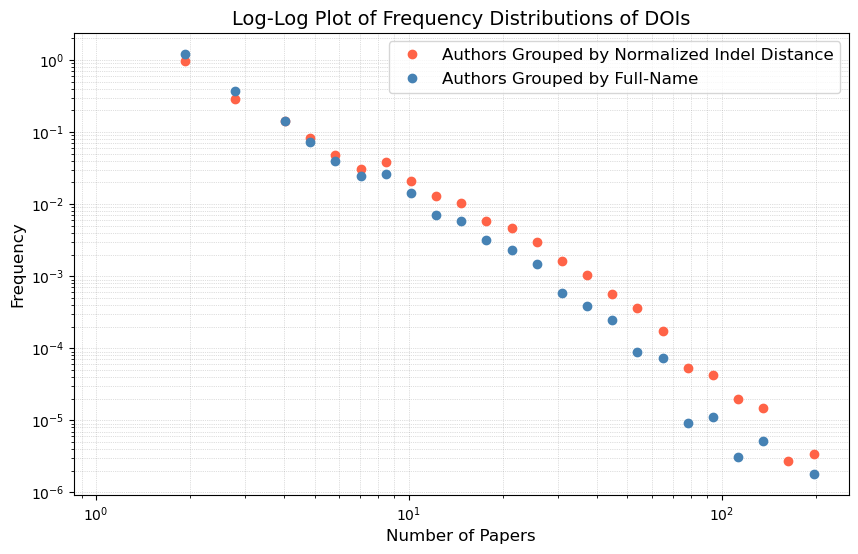

In [49]:
# function to create a histogram and plot it on a log-log scale
def histo_loglog(series, bins, shift=0.1, ax=None, color="b", label="", marker="o", density=True):
    if isinstance(series, pd.Series):
        vals = series.values + shift
    else:
        vals = series + shift
    
    hist, bin_edges = np.histogram(vals, bins=bins, density=density)
    xx = [0.5 * (bins[i] + bins[i + 1]) for i in range(len(bins) - 1)]
    
    if ax is None:
        fig, ax = plt.subplots()
    
    ax.loglog(xx, hist, marker, c=color, label=label)
    
    return hist, bin_edges

# combine the data to find the range for the histogram
combined_data = np.concatenate([normalized_indel_distance_matching['num_dois'].values, grouped_authors['num_dois'].values])

# set the shift value to avoid log(0) and create log-spaced bins
shift = 0.001
bins = np.logspace(np.log10(1), np.log10(max(combined_data) + shift), num=30, endpoint=True)

# create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))

# define a color palette 
color_palette = ["#FF6347", "#4682B4", "#32CD32", "#FFD700", "#8A2BE2", "#FF69B4"]

# plot histogram for normalized indel distance grouped authors
histo_loglog(normalized_indel_distance_matching['num_dois'], bins=bins, shift=shift, ax=ax, color=color_palette[0], label="Authors Grouped by Normalized Indel Distance")

# plot histogram for full name grouped authors
histo_loglog(grouped_authors['num_dois'], bins=bins, shift=shift, ax=ax, color=color_palette[1], label="Authors Grouped by Full-Name")

# enhance plot aesthetics
ax.set_xlabel("Number of Papers", fontsize=12)
ax.set_ylabel("Frequency", fontsize=12)
ax.set_title('Log-Log Plot of Frequency Distributions of DOIs', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, which="both", linestyle=':', linewidth=0.5, color='grey', alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)

# show the plot
plt.show()

### Pairwise Comparisons

In [21]:
# function to retrieve citations for each group of authors
def retrieve_citations(group):
    # grouping name and doi
    author_name = group['name']
    author_dois = group['doi']
    # subset citing_cited df based on author DOIs
    subset = sampled_citing_cited_physreve[sampled_citing_cited_physreve['citing_doi'].isin(author_dois)]
    return author_name, subset

In [23]:
# retrieve citations for each group of authors with progress bar
subsetted_citations = []

for _, group in tqdm(normalized_indel_distance_matching.iterrows(), total=len(normalized_indel_distance_matching), desc="Processing Authors"):
    subsetted_citations.append(retrieve_citations(group))

Processing Authors: 100%|██████████| 24390/24390 [25:36<00:00, 15.87it/s]


In [24]:
# process each author's citations to create a binary matrix
pairwise_comparisons_normalized_indel_distance = []

for author_name, subset_df in subsetted_citations:
    citing_dois = subset_df['citing_doi'].unique()
    cited_dois = subset_df['cited_doi'].unique()

    # create a df with citing_dois as rows and cited_dois as columns
    binary_matrix = pd.DataFrame(0, index=citing_dois, columns=cited_dois)

    # populate the binary matrix
    for citing_doi in citing_dois:
        cited_papers = subset_df[subset_df['citing_doi'] == citing_doi]['cited_doi']
        binary_matrix.loc[citing_doi, cited_papers] = 1

    pairwise_comparisons_normalized_indel_distance.append((author_name, binary_matrix))

In [25]:
# save the pairwise_comparisons to a pickle file
pickle_filename = "./Normalized Indel Distance Matching/pairwise_comparisons_normalized_indel_distance.pkl"
with open(pickle_filename, "wb") as f:
    pickle.dump(pairwise_comparisons_normalized_indel_distance, f)
print(f"Saved pairwise_comparisons_normalized_indel_distance to {pickle_filename}.")

Saved pairwise_comparisons_normalized_indel_distance to ./Normalized Indel Distance Matching/pairwise_comparisons_normalized_indel_distance.pkl.


In [26]:
# read the pairwise_comparisons from a pickle file
pickle_filename = "./Normalized Indel Distance Matching/pairwise_comparisons_normalized_indel_distance.pkl"
with open(pickle_filename, 'rb') as f:
    pairwise_comparisons_normalized_indel_distance = pickle.load(f)

pairwise_comparisons_normalized_indel_distance

[(' Priyanka',
                               10.1103/PhysRevA.16.732  \
  10.1103/PhysRevE.101.022101                        1   
  10.1103/PhysRevE.100.062122                        0   
  10.1103/PhysRevE.93.042104                         0   
  10.1103/PhysRevE.90.062104                         0   
  10.1103/PhysRevE.98.042105                         0   
  
                               10.1103/PhysRevB.28.1655  \
  10.1103/PhysRevE.101.022101                         0   
  10.1103/PhysRevE.100.062122                         1   
  10.1103/PhysRevE.93.042104                          0   
  10.1103/PhysRevE.90.062104                          0   
  10.1103/PhysRevE.98.042105                          0   
  
                               10.1103/PhysRevLett.55.2924  \
  10.1103/PhysRevE.101.022101                            1   
  10.1103/PhysRevE.100.062122                            0   
  10.1103/PhysRevE.93.042104                             0   
  10.1103/PhysRevE.90.062104 

### Cosine Similarities

In [ ]:
from multiprocessing import Pool, cpu_count

def cosine_similarity(v1, v2):
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    product = np.dot(v1, v2)
    return product / (norm_v1 * norm_v2)

def compute_correlation_matrix(pair):
    author_name, binary_matrix = pair
    correlation_matrix = binary_matrix.T.corr(method=cosine_similarity)
    return correlation_matrix

# determine the number of cores to use
num_cores = min(cpu_count(), 18)  

# use multiprocessing to parallelize the computation
if __name__ == "__main__":
    with Pool(num_cores) as pool:
        cosine_similarities_normalized_indel_distance = list(tqdm(pool.imap(compute_correlation_matrix, pairwise_comparisons_normalized_indel_distance), total=len(pairwise_comparisons_normalized_indel_distance)))

    # optionally save the result to a file
    with open('./Normalized Indel Distance Matching/cosine_similarities_normalized_indel_distance.pkl', 'wb') as f:
        pickle.dump(cosine_similarities_normalized_indel_distance, f)

In [70]:
# read the citation_probabilities from a pickle file
pickle_filename = "./Normalized Indel Distance Matching/cosine_similarities_normalized_indel_distance.pkl"
with open(pickle_filename, 'rb') as f:
    cosine_similarities_normalized_indel_distance = pickle.load(f)

cosine_similarities_normalized_indel_distance

[                             10.1103/PhysRevE.101.022101  \
 10.1103/PhysRevE.101.022101                     1.000000   
 10.1103/PhysRevE.100.062122                     0.076696   
 10.1103/PhysRevE.93.042104                      0.085749   
 10.1103/PhysRevE.90.062104                      0.000000   
 10.1103/PhysRevE.98.042105                      0.000000   
 
                              10.1103/PhysRevE.100.062122  \
 10.1103/PhysRevE.101.022101                     0.076696   
 10.1103/PhysRevE.100.062122                     1.000000   
 10.1103/PhysRevE.93.042104                      0.223607   
 10.1103/PhysRevE.90.062104                      0.000000   
 10.1103/PhysRevE.98.042105                      0.000000   
 
                              10.1103/PhysRevE.93.042104  \
 10.1103/PhysRevE.101.022101                    0.085749   
 10.1103/PhysRevE.100.062122                    0.223607   
 10.1103/PhysRevE.93.042104                     1.000000   
 10.1103/PhysRevE.90.062

In [71]:
# filter out cosine similarity matrices that have only one entry
cosine_similarities_normalized_indel_distance_filtered = [author for author in cosine_similarities_normalized_indel_distance if len(author) > 1]

# calculate the mean cosine similarity for each author based on their name similarity
mean_author_cosine_similarities = [(np.sum(author.values) - len(author)) / 2 / ((len(author) - 1) * len(author) / 2) for author in cosine_similarities_normalized_indel_distance_filtered]

# convert the list of mean cosine similarities into a pandas Series 
mean_author_cosine_similarities_series = pd.Series(mean_author_cosine_similarities)

# calculate the lengths of the matrices where the mean cosine similarity is zero
lengths_of_matrices = [len(author) for author, similarity in zip(cosine_similarities_normalized_indel_distance_filtered, mean_author_cosine_similarities) if similarity == 0]

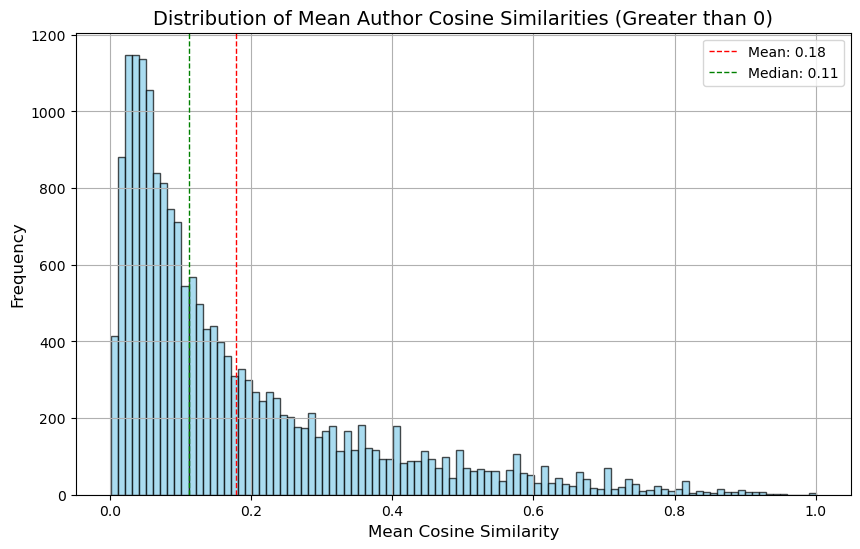

In [72]:
# filter the series for values greater than 0
filtered_series = mean_author_cosine_similarities_series[mean_author_cosine_similarities_series > 0]

# create the histogram plot
plt.figure(figsize=(10, 6))
plt.hist(filtered_series, bins=100, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Mean Author Cosine Similarities (Greater than 0)', fontsize=14)
plt.xlabel('Mean Cosine Similarity', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)

# add annotations for mean and median
mean_val = filtered_series.mean()
median_val = filtered_series.median()
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1, label=f'Median: {median_val:.2f}')

# add legend
plt.legend()

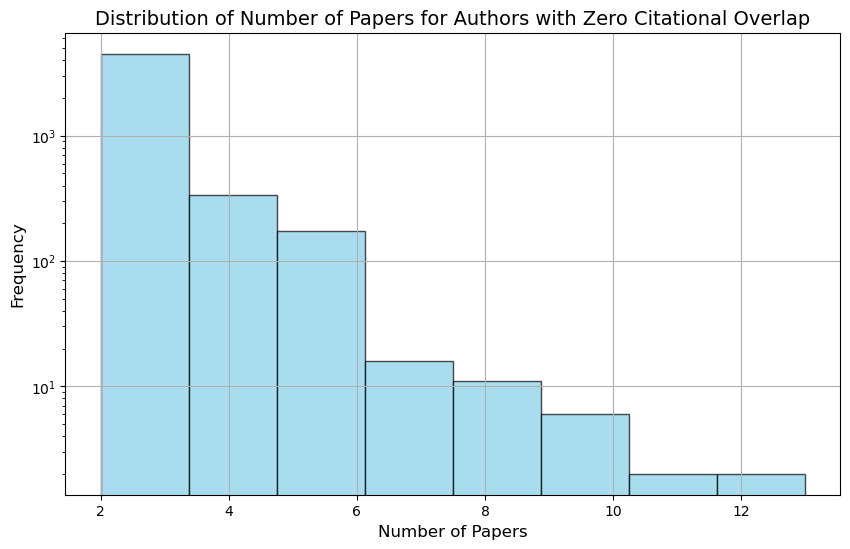

In [73]:
plt.figure(figsize=(10, 6))

plt.hist(lengths_of_matrices, bins=8, color='skyblue', edgecolor='black', alpha=0.7, log=True)
plt.title('Distribution of Number of Papers for Authors with Zero Citational Overlap', fontsize=14)
plt.xlabel('Number of Papers', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)